In [37]:
import pandas as pd
import pandas_datareader as web
import numpy as np
import requests
import json
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.cluster import KMeans
import finnhub
import time
import plotly.express as px
from random import sample
from datetime import datetime

In [38]:
# get stocks selected by clustering algorithm
stocks2010 = pd.read_csv("portfolio2010_topstocks.csv")
stocks2011 = pd.read_csv("portfolio2011.top_stocks.csv")
stocks2012 = pd.read_csv("portfolio2012.top_stocks.csv")
stocks2013 = pd.read_csv("portfolio2013.top_stocks.csv")
stocks2014 = pd.read_csv("portfolio2014.top_stocks.csv")

list_of_frames = [stocks2010,stocks2011,stocks2012,stocks2013,stocks2014]

In [39]:
stocks_for_test = pd.concat(list_of_frames)


In [40]:
test_stocks= stocks_for_test["Symbol"].value_counts().to_frame()
test_stocks["portfolio_weight"] = test_stocks["Symbol"]*(1/34)

In [41]:
test_portfolio_weights = test_stocks.drop("Symbol", axis =1)

In [62]:
test_weights = test_portfolio_weights.reset_index().rename(columns={"index":"Symbol"})

In [63]:
test_weights = test_weights.sort_values(by='Symbol')

In [64]:
portfolio_testing_tickers = test_portfolio_weights.index.to_list()

In [65]:
# obtain pricing data for stocks in Portfolio Clustered - to annual returns 

In [74]:
def callCounter():
    callCounter.counter += 1
    print(callCounter.counter)
callCounter.counter = 0

finnhub_client = finnhub.Client(api_key="c7rah32ad3icp4g2mrig")

In [70]:
def getPrice(stock, start_time,end_time):
    try:
        res = finnhub_client.stock_candles(stock, 'D', start_time, end_time)
        df = pd.DataFrame(res)
        df["Symbol"] = stock
    except:
        data = [[0,0,0,0,0,0,0,stock]]
        df = pd.DataFrame(data, columns = ['c', 'h', 'l', 'o', 's', 't', 'v', 'Symbol'])
    return df

In [71]:
def getTestTickersPrice(tickers, start_time, end_time):
    df_list = []
    for ticker in tickers:
        callCounter()
        if callCounter.counter %59 == 0:
            time.sleep(60)
        else:
            df1 = getPrice(ticker, start_time, end_time) 
            df_list.append(df1)
    return  pd.concat(df_list)      

In [58]:
def convertUnixTimeStamp( dataFrame ):
    list_of_dates = []
    for timestamp in dataFrame['t']:
        ts = datetime.utcfromtimestamp(int(timestamp)).strftime('%Y-%m-%d %H:%M:%S')
        list_of_dates.append(ts)
    return list_of_dates[:253] # 250 ,251, 252, 253 trading days varies on year and holiday calendars

In [59]:
def calculateReturnsAndReturnDailyPlot ( df_prices, test_weights, portfolio_testing_tickers, year ):
    # calculate individual returns 
    result = df_prices.pivot_table(values='c',index=df_prices.index,columns='Symbol')
    fig, ax = plt.subplots(figsize=(20,14))
    sns.heatmap(result.corr(), annot=True, cmap='RdYlGn', vmin=-1, vmax=1, center=0, ax=ax)
    plt.title('LINEAR CORRELATION MATRIX -'+ year)
    plt.show()
    
    dates = convertUnixTimeStamp( df_prices )
    dates = dates[:251] # mainly 251
    # calculate annual returns
    cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
    cum_return = cum_return.to_frame()
    cum_return = cum_return.rename(columns={0: "Annual_Return"})
    cum_return = cum_return.reset_index()

    cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

    cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

    print(cum_returns.Weighted_Returns.sum()*100)

    # compute daily returns using pandas pct_change()
    df_daily_returns = result.pct_change()
    df_daily_returns.drop(index=df_daily_returns.index[0], 
            axis=0, 
            inplace=True)

    # convert to percentages
    df_daily_returns = df_daily_returns[portfolio_testing_tickers]*100
    # add the dates in ahead of plotting
    df_daily_returns['Date'] =  dates

    # plot daily returns
    fig = px.line(df_daily_returns, x='Date',
                  y=portfolio_testing_tickers, 
                  title='Performance - ' + year + ' Daily Returns for Stocks in Portfolio Clustered',
                  labels={'value':'Daily Returns (%)', 'Date':"Date (Trading Days)"}
                  )
    fig.show()

In [51]:
# 2015 - NOTE ^ refresh the call counter after every year

In [52]:
df_prices_2015 = getTestTickersPrice(portfolio_testing_tickers,1420070400 ,1451602800)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


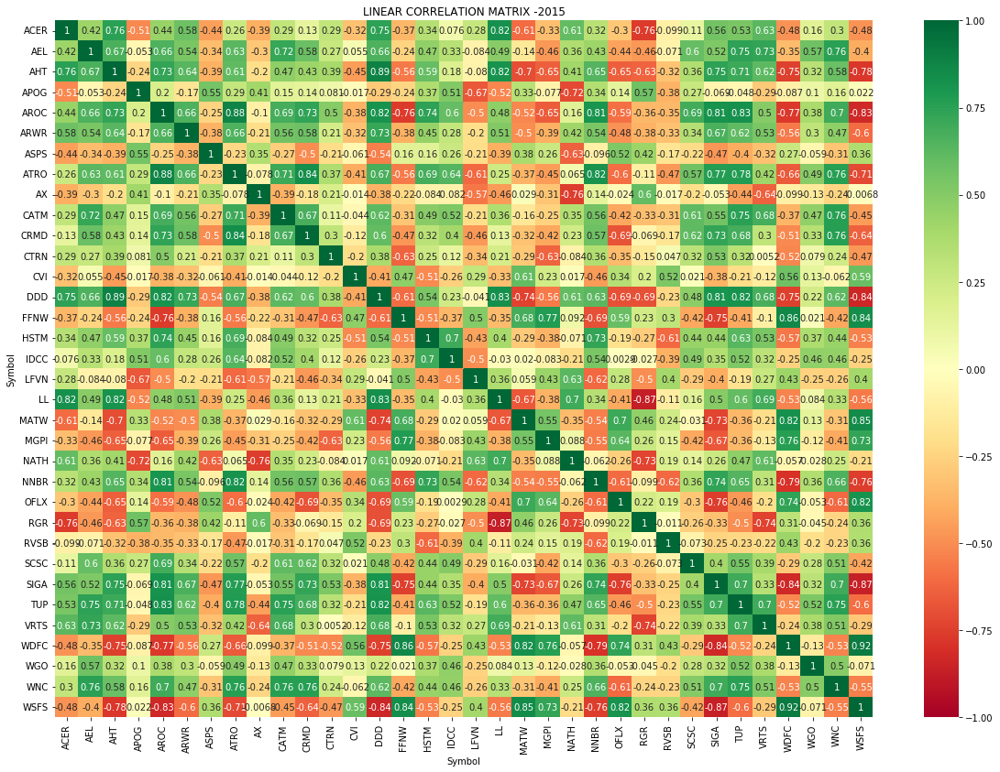

-10.171798438492441


In [53]:
calculateReturnsAndReturnDailyPlot(df_prices_2015,test_weights, portfolio_testing_tickers, year="2015")

In [60]:
# 2016
df_prices_2016 = getTestTickersPrice(portfolio_testing_tickers,1451606400 ,1483228740)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


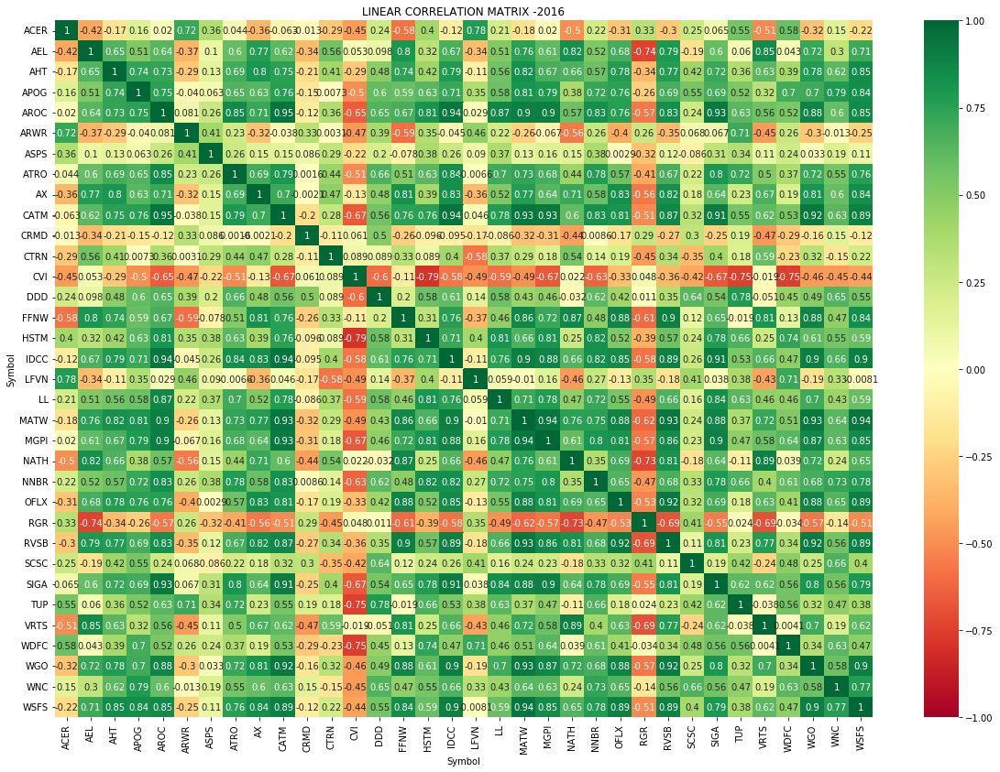

28.267401634040755


In [61]:
calculateReturnsAndReturnDailyPlot(df_prices_2016, test_weights, portfolio_testing_tickers, year="2016")

In [33]:
# 2017 
df_prices_2017 = getTestTickersPrice(portfolio_testing_tickers,1483228800 ,1514764740)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


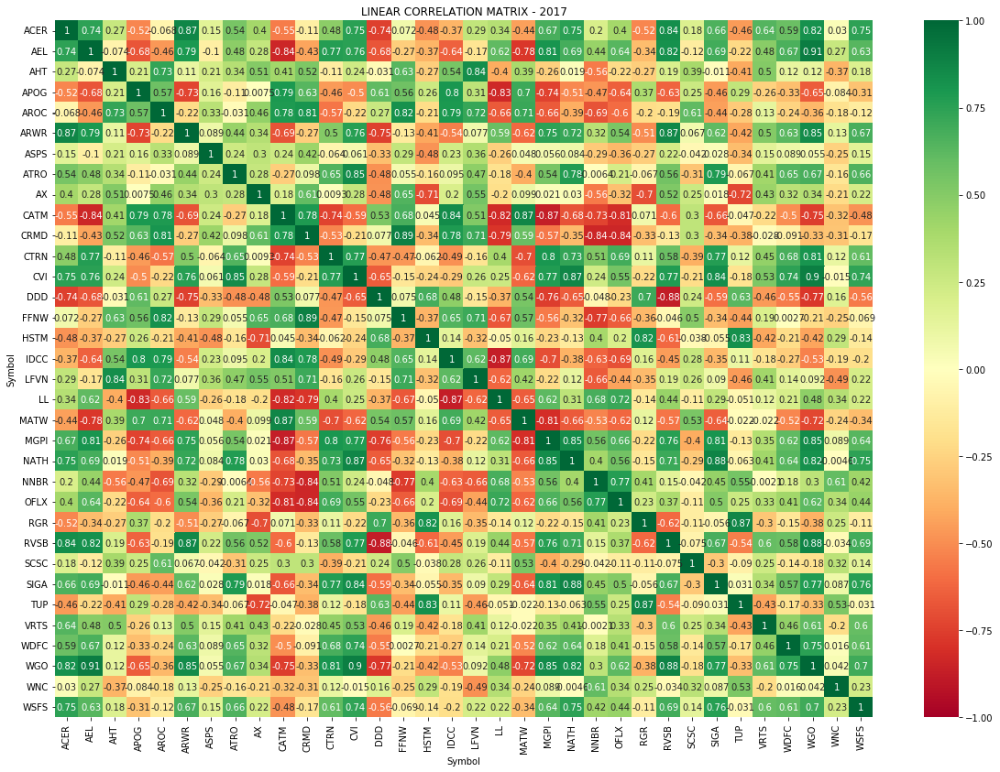

9.876972318007716


In [36]:
# has one less trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( df_prices_2017 )
dates = dates[:250]

result = df_prices_2017.pivot_table(values='c',index=df_prices_2017.index,columns='Symbol')
fig, ax = plt.subplots(figsize=(20,14))
sns.heatmap(result.corr(), annot=True, cmap='RdYlGn', vmin=-1, vmax=1, center=0, ax=ax)
plt.title('LINEAR CORRELATION MATRIX - 2017')
plt.show()

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)

# compute daily returns using pandas pct_change()

df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)

# convert to percentages
df_daily_returns = df_daily_returns[portfolio_testing_tickers]*100
# add the dates in ahead of plotting
df_daily_returns['Date'] =  dates[:250]

# plot daily returns
fig = px.line(df_daily_returns, x='Date',
              y=portfolio_testing_tickers, 
              title='Performance - ' + "2017" + ' Daily Returns for Stocks in Portfolio Clustered',
              labels={'value':'Daily Returns (%)', 'Date':"Date (Trading Days)"}
              )
fig.show()

In [ ]:
# 2018

In [67]:
df_prices_2018 = getTestTickersPrice(portfolio_testing_tickers,1514764800 ,1546300740)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


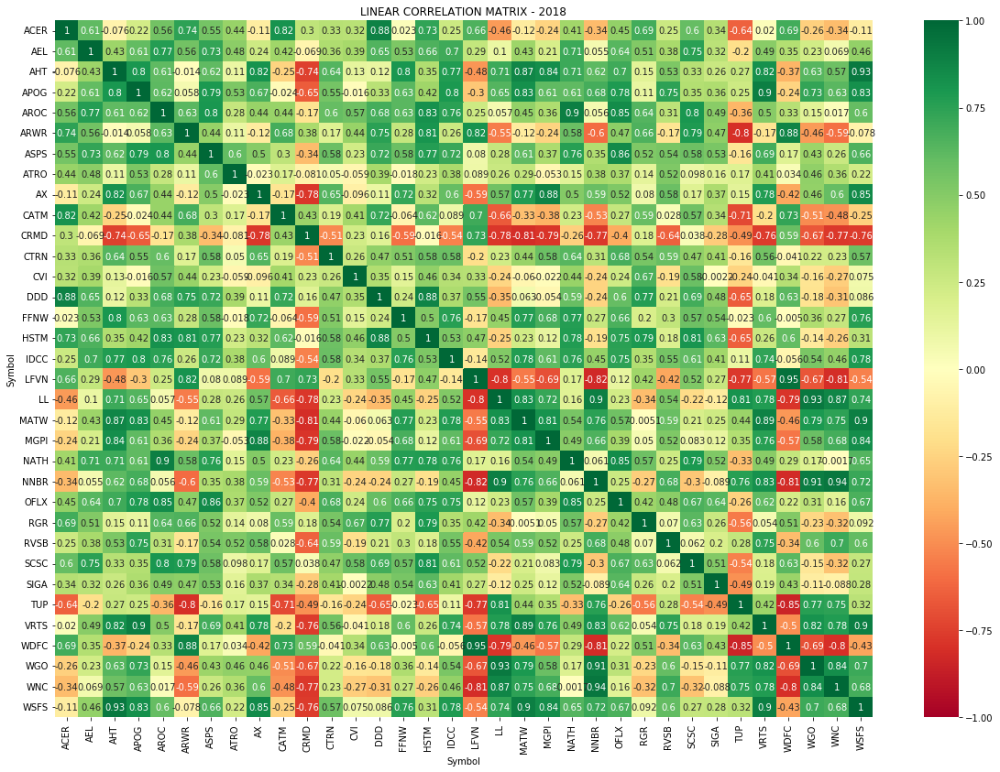

4.910209065355943


In [104]:
# has one less trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( df_prices_2018 )
dates = dates[:250]

result = df_prices_2018.pivot_table(values='c',index=df_prices_2018.index,columns='Symbol')
fig, ax = plt.subplots(figsize=(20,14))
sns.heatmap(result.corr(), annot=True, cmap='RdYlGn', vmin=-1, vmax=1, center=0, ax=ax)
plt.title('LINEAR CORRELATION MATRIX - 2018')
plt.show()

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)

# compute daily returns using pandas pct_change()

df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)

# convert to percentages
df_daily_returns = df_daily_returns[portfolio_testing_tickers]*100
# add the dates in ahead of plotting
df_daily_returns['Date'] =  dates[:250]

# plot daily returns
fig = px.line(df_daily_returns, x='Date',
              y=portfolio_testing_tickers, 
              title='Performance - ' + "2018" + ' Daily Returns for Stocks in Portfolio Clustered',
              labels={'value':'Daily Returns (%)', 'Date':"Date (Trading Days)"}
              )
fig.show()

In [ ]:
# 2019

In [72]:
df_prices_2019 = getTestTickersPrice(portfolio_testing_tickers,1546300800 ,1577836740)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


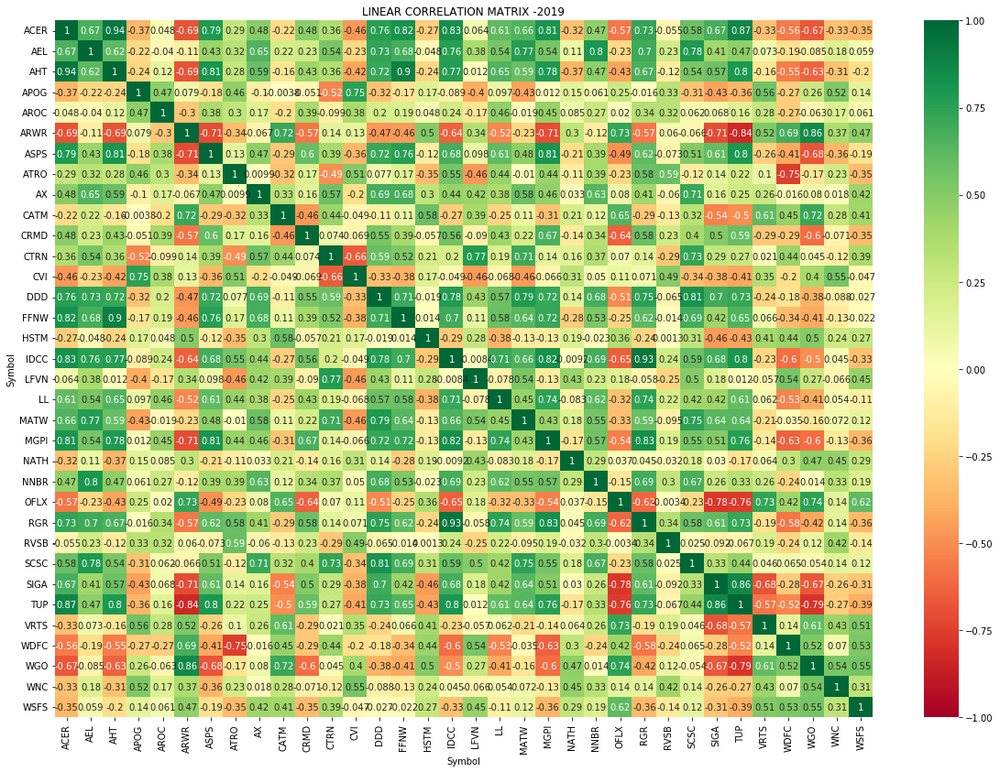

18.572098299647738


In [73]:
calculateReturnsAndReturnDailyPlot(df_prices_2019, test_weights, portfolio_testing_tickers, year="2019")

In [75]:
# 2020
df_prices_2020 = getTestTickersPrice(portfolio_testing_tickers,1577836800 ,1609459140)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


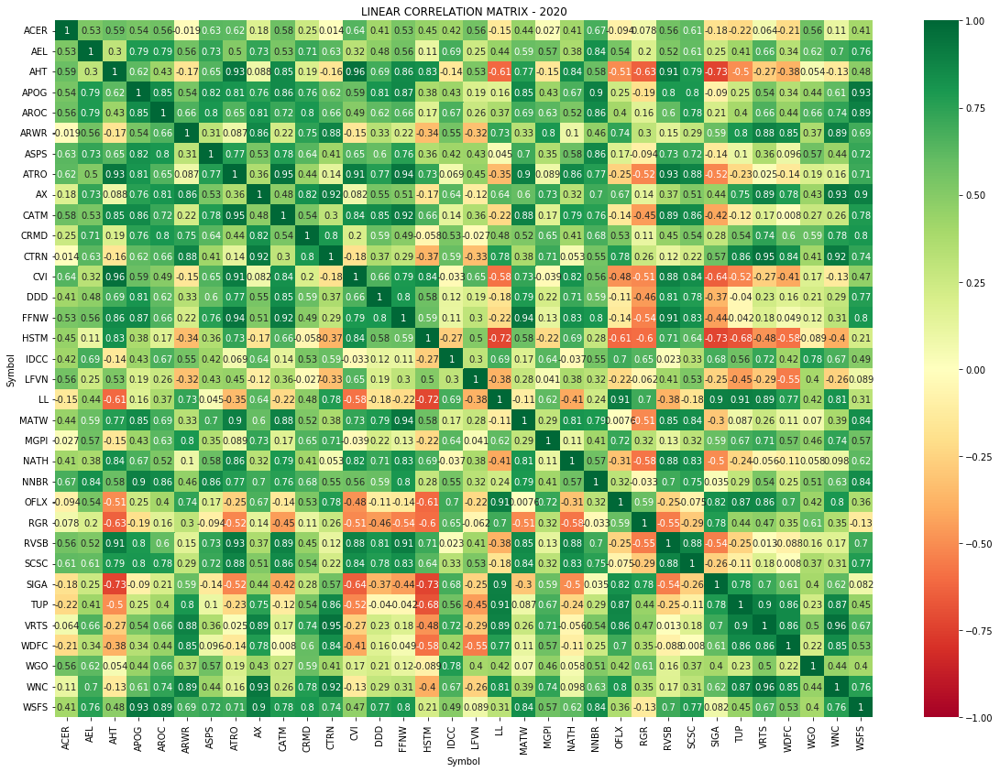

11.453475911291486


In [105]:
# has one more trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( df_prices_2020 )
dates = dates[:252]

result = df_prices_2020.pivot_table(values='c',index=df_prices_2020.index,columns='Symbol')
fig, ax = plt.subplots(figsize=(20,14))
sns.heatmap(result.corr(), annot=True, cmap='RdYlGn', vmin=-1, vmax=1, center=0, ax=ax)
plt.title('LINEAR CORRELATION MATRIX - 2020')
plt.show()

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)



In [465]:
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)

In [466]:
df_daily_returns = df_daily_returns[portfolio_testing_tickers]*100

In [467]:

# add the dates in ahead of plotting
df_daily_returns['Date'] =  dates

# plot daily returns
fig = px.line(df_daily_returns, x='Date',
              y="AHT", 
              title='Performance - ' + "2020" + ' Daily Returns for AHT',
              labels={'value':'Daily Returns (%)', 'Date':"Date (Trading Days)"}
              )
fig.show()

In [527]:
# remove AHT as it is upsets the plot for other values
portfolio_testing_tickers
# add the dates in ahead of plotting
df_daily_returns['Date'] =  dates

# plot daily returns
fig = px.line(df_daily_returns, x='Date',
              y=portfolio_testing_tickers, 
              title='Performance - ' + "2020" + ' Daily Returns for Stocks in Portfolio Clustered',
              labels={'value':'Daily Returns (%)', 'Date':"Date (Trading Days)"}
              )
fig.show()

# Portfolio Random

In [517]:
# get the list of tickers present across all 10 years
stocks2010 = pd.read_csv("stocks2010_inall.csv")
all_stocks = stocks2010.symbol.to_list()
# select 34 random stocks

portfolio_random_stocks = sample(all_stocks, 34)
print(portfolio_random_stocks)

['GBX', 'BMTC', 'EGLE', 'ARR', 'ITRI', 'SHBI', 'CBZ', 'SMBC', 'AGX', 'DDD', 'EME', 'HAFC', 'PROV', 'LCNB', 'UIS', 'GCBC', 'WMK', 'SB', 'GENC', 'CDMO', 'CVCY', 'VPG', 'SFST', 'CNO', 'RTW', 'RBCAA', 'IHC', 'TOWN', 'POWI', 'DK', 'BELFB', 'AAWW', 'DCOM', 'GBCI']


In [11]:
random_selcted = ['GBX', 'BMTC', 'EGLE', 'ARR', 'ITRI', 'SHBI', 'CBZ', 'SMBC', 'AGX', 'DDD', 'EME', 'HAFC', 'PROV', 'LCNB', 'UIS', 'GCBC', 'WMK', 'SB', 'GENC', 'CDMO', 'CVCY', 'VPG', 'SFST', 'CNO', 'RTW', 'RBCAA', 'IHC', 'TOWN', 'POWI', 'DK', 'BELFB', 'AAWW', 'DCOM', 'GBCI']

In [31]:
# equal test weights 
equal_weights = pd.DataFrame(random_selcted, columns=['Symbol'])
equal_weights['portfolio_weight'] = (1/34)


In [522]:
# 2015
random_prices_2015 = getTestTickersPrice(random_selcted,1420070400 ,1451602800)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [523]:
calculateReturnsAndReturnDailyPlot(random_prices_2015,equal_weights,random_selcted, year="2015")

-11.14980970127768


In [525]:
# 2016
random_prices_2016 = getTestTickersPrice(random_selcted,1451606400 ,1483228740)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [516]:
calculateReturnsAndReturnDailyPlot(random_prices_2016,equal_weights,random_selcted, year="2016")

35.46627894442694


In [17]:
# 2017
random_prices_2017 = getTestTickersPrice(random_selcted,1483228800 ,1514764740)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [18]:
# has one less trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( random_prices_2017 )
dates = dates[:250]

result = random_prices_2017.pivot_table(values='c',index=random_prices_2017.index,columns='Symbol')

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)


-1.0849482232630083


In [24]:
#2018
random_prices_2018 = getTestTickersPrice(random_selcted,1514764800 ,1546300740)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [35]:
# has one less trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( random_prices_2018 )
dates = dates[:250]

result = random_prices_2018.pivot_table(values='c',index=random_prices_2018.index,columns='Symbol')

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)



0.36034281262173723


In [29]:
#2019
random_prices_2019 = getTestTickersPrice(random_selcted,1546300800 ,1577836740)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [34]:
# has one less trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( random_prices_2019 )
dates = dates[:250]

result = random_prices_2019.pivot_table(values='c',index=random_prices_2019.index,columns='Symbol')

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)


-0.47846889952153093


In [38]:
#2020
random_prices_2020 = getTestTickersPrice(random_selcted,1577836800 ,1609459140)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34


In [41]:
# has one more trading day of data so the above calculateReturnsAndReturnDailyPlot() will return a mismatch in index
dates = convertUnixTimeStamp( random_prices_2020 )
dates = dates[:252]

result = random_prices_2020.pivot_table(values='c',index=random_prices_2020.index,columns='Symbol')

# compute daily returns using pandas pct_change()
df_daily_returns = result.pct_change()
df_daily_returns.drop(index=df_daily_returns.index[0], 
        axis=0, 
        inplace=True)


# calculate annual returns
cum_return = (result.iloc[-1] - result.iloc[0]) / result.iloc[0]
cum_return = cum_return.to_frame()
cum_return = cum_return.rename(columns={0: "Annual_Return"})
cum_return = cum_return.reset_index()

cum_returns= pd.merge(cum_return, test_weights, on="Symbol")

cum_returns['Weighted_Returns'] = cum_returns['Annual_Return']*cum_returns['portfolio_weight']

print(cum_returns.Weighted_Returns.sum()*100)



0.6017579445571336


In [37]:
def callCounter():
    callCounter.counter += 1
    print(callCounter.counter)
callCounter.counter = 0

finnhub_client = finnhub.Client(api_key="c7rah32ad3icp4g2mrig")

# SP 500
Annual returns for the SP500 were downloaded from:
https://ycharts.com/indicators/sp_500_total_return_annual

In [82]:
import pandas as pd
import plotly.express as px

# SP500 DATA
sp500Returns = pd.read_csv("sp-500-historical-annual-returns.csv")

sp500Returns = sp500Returns.rename(columns={"Returns":"SP500_Returns (%)"})
sp500Returns = sp500Returns.tail(6).reset_index()
returnComparison = sp500Returns[["Date","SP500_Returns (%)"]]

# Portfolio Clustered

In [94]:
# list of returns for portfolio clustered
portfolioClusteredReturns = [-10.171798438492441,
28.267401634040755,
12.466234210521819,
4.910209065355943,
18.572098299647738,
11.453475911291486]

In [95]:
returnComparison["Clustered_Returns (%)"] = portfolioClusteredReturns
# to 2 decimal places
returnComparison["Clustered_Returns (%)"] = returnComparison["Clustered_Returns (%)"].round(decimals = 2)

# Portfolio Random

In [96]:
portfolioRandomReturns = [-11.1498097012776,
35.46627894442694,
-1.0849482232630083,
0.36034281262173723,
-0.47846889952153093,
0.6017579445571336]

In [97]:
returnComparison["Random_Returns (%)"] = portfolioRandomReturns
# to 2 decimal places
returnComparison["Random_Returns (%)"] = returnComparison["Random_Returns (%)"].round(decimals = 2)

In [98]:
returnComparison

,Date,SP500_Returns (%),Clustered_Returns (%),Random_Returns (%)
0,12/31/2015,1.38,-10.17,-11.15
1,12/30/2016,11.96,28.27,35.47
2,12/29/2017,21.83,12.47,-1.08
3,12/31/2018,-4.38,4.91,0.36
4,12/31/2019,31.49,18.57,-0.48
5,12/31/2020,18.40,11.45,0.60


In [99]:
fig = px.line(returnComparison, x='Date',
              y=["SP500_Returns (%)", "Clustered_Returns (%)", "Random_Returns (%)"] ,
              title=' Portfolio Return Comparison',
                labels={'value':'Annual returns (%)', }
              )
fig.update_xaxes(
     tickformat="%b\n%Y")
fig.show()

In [100]:
def simulatedInvestment(amount, dataFrameColumn ):
    investment = amount
    for returns in dataFrameColumn.to_list():
        investment = (1+(returns/100))*investment
    print(investment)

In [101]:
# example of investment for SP500
simulatedInvestment(1000,returnComparison["SP500_Returns (%)"])

2058.5555362962405


In [102]:
# example of investment for Portfolio Clustered
simulatedInvestment(1000,returnComparison["Clustered_Returns (%)"])

1796.6147847718767


In [103]:
# example of investment for SP500
simulatedInvestment(1000,returnComparison["Random_Returns (%)"])

1196.337376438799
